In [3]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [4]:
import tensorflow as tf

gpu_devices = tf.config.experimental.list_physical_devices('GPU')
if gpu_devices:
    # Set a memory limit of 4096MB (4GB)
    tf.config.experimental.set_virtual_device_configuration(
        gpu_devices[0],
        [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=4096)]
    )

# Check if GPU is being used
print("GPU Available:", tf.config.list_physical_devices('GPU'))


GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [5]:
from keras import Input
from keras.layers import Dense, Conv2D, UpSampling2D, add, concatenate
from keras.models import Model
from keras.optimizers import RMSprop
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
TARGET_SIZE = 512

In [7]:
input_tensor = Input(shape=(TARGET_SIZE, TARGET_SIZE, 1))

layer1 = Conv2D(8, (3, 3), activation='relu', padding='same', strides=2)(input_tensor)
layer2 = Conv2D(16, (3, 3), activation='relu', padding='same')(layer1)
layer3 = Conv2D(16, (3, 3), activation='relu', padding='same', strides=2)(layer2)
layer4 = Conv2D(32, (3, 3), activation='relu', padding='same')(layer3)
layer5 = Conv2D(32, (3, 3), activation='relu', padding='same', strides=2)(layer4)
layer6 = Conv2D(32, (3, 3), activation='relu', padding='same')(layer5)
layer7 = Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(layer6)
layer8 = Conv2D(64, (3, 3), activation='relu', padding='same')(layer7)
layer9 = Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(layer8)
layer10 = Conv2D(64, (3, 3), activation='relu', padding='same')(layer9)
layer11 = Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(layer10)
layer12 = Conv2D(64, (3, 3), activation='relu', padding='same')(layer11)
layer13 = Conv2D(64, (3, 3), activation='relu', padding='same', strides=2)(layer12)

layer14 = UpSampling2D((2, 2))(layer13)
layer15 = Conv2D(64, (3, 3), activation='relu', padding='same')(layer14)

layer16 = concatenate([layer15, layer11])
layer17 = UpSampling2D((2, 2))(layer16)
layer18 = Conv2D(64, (3, 3), activation='relu', padding='same')(layer17)

layer19 = concatenate([layer18, layer9])
layer20 = UpSampling2D((2, 2))(layer19)
layer21 = Conv2D(64, (3, 3), activation='relu', padding='same')(layer20)

layer22 = concatenate([layer21, layer7])
layer23 = UpSampling2D((2, 2))(layer22)
layer24 = Conv2D(64, (3, 3), activation='relu', padding='same')(layer23)

layer25 = concatenate([layer24, layer5])
layer26 = UpSampling2D((2, 2))(layer25)
layer27 = Conv2D(32, (3, 3), activation='relu', padding='same')(layer26)

layer28 = concatenate([layer27, layer3])
layer29 = UpSampling2D((2, 2))(layer28)
layer30 = Conv2D(16, (3, 3), activation='relu', padding='same')(layer29)

layer31 = concatenate([layer30, layer1])
layer32 = UpSampling2D((2, 2))(layer31)
layer33 = Conv2D(3, (3,3), activation='tanh', padding='same')(layer32)

model = Model(input_tensor, layer33)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 8)  80          ['input_1[0][0]']                
                                                                                                  
 conv2d_1 (Conv2D)              (None, 256, 256, 16  1168        ['conv2d[0][0]']                 
                                )                                                                 
                                                                                              

In [8]:
model.compile(optimizer=RMSprop(lr=3e-5), loss='mse')

c:\Users\dell\anaconda3\envs\tensor_v2.10\lib\site-packages\keras\optimizers\optimizer_v2\rmsprop.py:140: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [41]:
input_images_dir = '''inputs'''
label_images_dir = '''targets'''

In [42]:
import os

In [43]:
fnames = os.listdir(input_images_dir)
fpaths = [os.path.join(input_images_dir, fname) for fname in fnames]

In [44]:
def resize_img_to_target_size(img_path, target_size, num_channels):
  color_mode = 'grayscale' if num_channels == 1 else 'rgb'
  img = load_img(img_path, color_mode=color_mode)
  img_array = img_to_array(img)
  width, height, _ = img_array.shape
  max_dim = max(width, height)
  scale_factor = target_size / max_dim
  
  scaled_width, scaled_height = int(width * scale_factor), int(height * scale_factor)
  img = load_img(img_path, target_size=(scaled_width, scaled_height), color_mode=color_mode)
  img_array = img_to_array(img) / 255
  resized_img_array = np.zeros( (target_size, target_size, num_channels) )
  resized_img_array[ (target_size - scaled_width)//2: (target_size - scaled_width)//2 + scaled_width,
                     (target_size - scaled_height)//2: (target_size - scaled_height)//2 + scaled_height, 
                      : ] = img_array
  return resized_img_array

In [46]:
def generator(fnames, batch_size, target_size):
  
  input_fpaths = [os.path.join(input_images_dir, fname) for fname in fnames]
  label_fpaths = [os.path.join(label_images_dir, fname) for fname in fnames]
  
  def get_batches(iterable, n=1):
    l = len(iterable)
    for ndx in range(0, l-n, n):
        yield iterable[ndx:min(ndx + n, l)]
  
  while True:
    for batch in get_batches( list(zip(input_fpaths, label_fpaths)), batch_size ):
      X = np.zeros( (batch_size, target_size, target_size, 1) )
      Y = np.zeros( (batch_size, target_size, target_size, 3) )
      for i, (x_fpath, y_fpath) in enumerate(batch):
        X[i, :, :, :] = resize_img_to_target_size(x_fpath, target_size, 1)
        Y[i, :, :, :] = resize_img_to_target_size(y_fpath, target_size, 3)
      yield X, Y

In [47]:
import random

test_pct = 0.15
val_pct = 0.15

num_files = len(fnames)
num_test_files = int( test_pct * num_files )
num_valid_files = int( val_pct * num_files )
num_train_files = num_files - num_test_files - num_valid_files

random.shuffle(fnames)

test_fnames = fnames[: num_test_files ]
valid_fnames = fnames[num_test_files: num_test_files + num_valid_files]
train_fnames = fnames[num_test_files + num_valid_files: ]

In [48]:
BATCH_SIZE = 8

In [49]:
train_generator = generator(train_fnames, BATCH_SIZE, TARGET_SIZE)
valid_generator = generator(valid_fnames, BATCH_SIZE, TARGET_SIZE)
test_generator = generator(test_fnames, BATCH_SIZE, TARGET_SIZE)

In [50]:
def plot_loss(history_dict):
  x_axis = range( len(history_dict['loss']) )
  plt.scatter(x_axis, history_dict['loss'], label='Training Loss')
  plt.plot(x_axis, history_dict['val_loss'], label='Validation Loss')
  plt.legend()
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.title('Loss Plot')
  plt.show()

In [51]:
def append_to_history(history):
  for lst in history.history:
    if not lst in history_dict:
      history_dict[lst] = history.history[lst]
    else:
      history_dict[lst] += history.history[lst]

In [52]:
import pickle

history_dict = {}
with open('history.pkl', 'wb') as f:
  pickle.dump(history_dict, f)

In [53]:
def preprocess(img_path, num_channels, target_size=TARGET_SIZE):
  img_arr = resize_img_to_target_size(img_path, target_size, num_channels)
  img_arr = img_arr.reshape( (1, ) + img_arr.shape )
  return img_arr

In [54]:
def visualize_model(model, fnames, num_files=1, save_to_disc=False):
  random.shuffle(fnames)
  for fname in fnames[:num_files]:
    input_fpath = os.path.join(input_images_dir, fname)
    label_fpath = os.path.join(label_images_dir, fname)
    
    fig = plt.figure(figsize=(25, 25))
    
    ax = fig.add_subplot(131)
    img_array = preprocess(input_fpath, 1)
    img = array_to_img(img_array[0] * 255)
    plt.imshow(img, cmap='gray')
    plt.title('Input Image')
    
    ax = fig.add_subplot(132)
    img_array = preprocess(label_fpath, 3)
    img = array_to_img(img_array[0] * 255)
    plt.imshow(img)
    plt.title('Label Image')
    
    ax = fig.add_subplot(133)
    img_arr = preprocess(input_fpath, 1)
    img = array_to_img(model.predict(img_arr)[0] * 255)
    plt.imshow(img)
    plt.title('Predicted Image')
    
    if save_to_disc:
        plt.savefig( os.path.join(results_dir, fname) )
    plt.show()
    plt.close(fig)

This is before any training

1/1 [==============================] - 0s 177ms/step


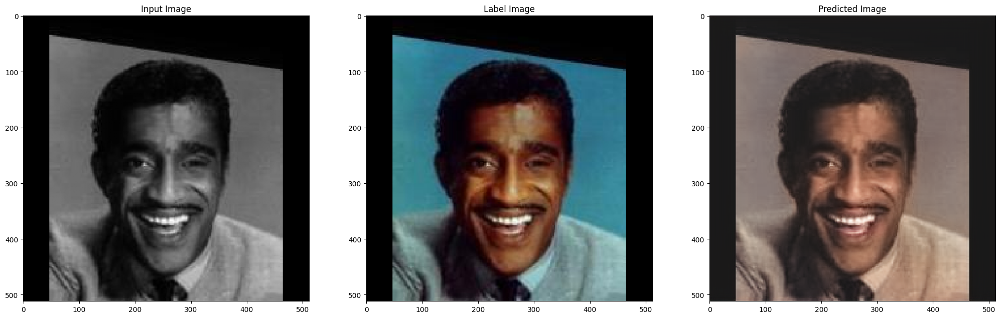

1/1 [==============================] - 0s 17ms/step


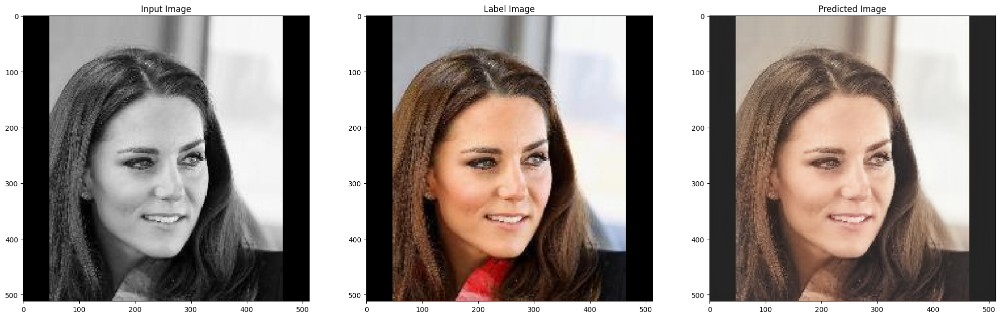

1/1 [==============================] - 0s 46ms/step


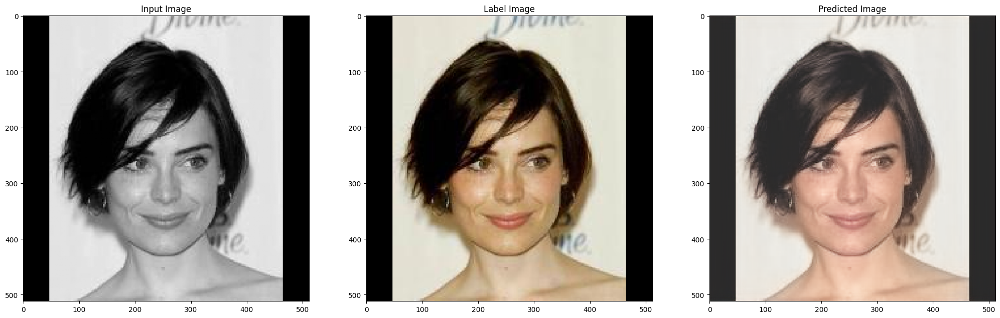

1/1 [==============================] - 0s 25ms/step


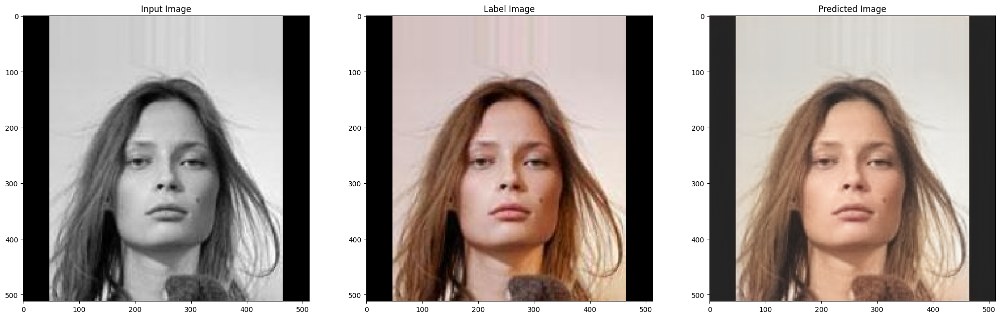

1/1 [==============================] - 0s 23ms/step


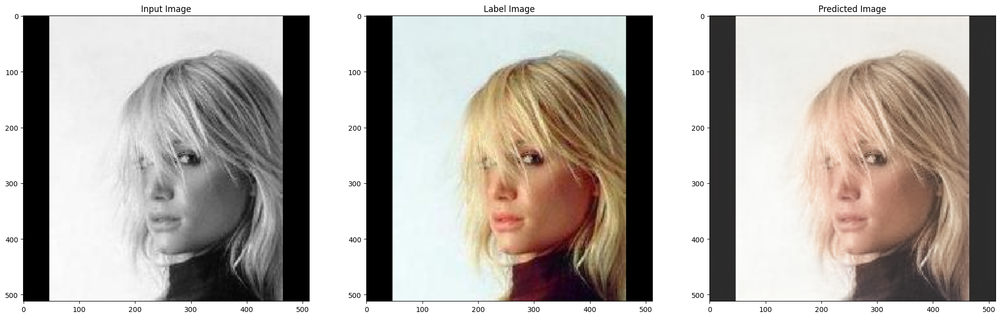

In [57]:
model = tf.keras.models.load_model("new_model6.h5")
visualize_model(model, valid_fnames, num_files=5)

1/1 [==============================] - 0s 31ms/step


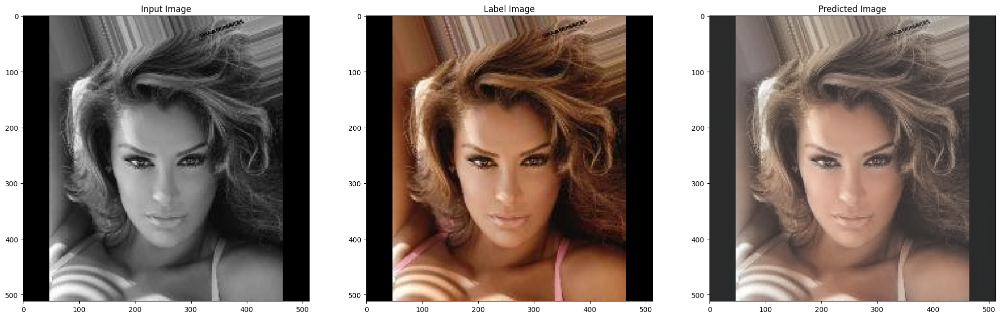

1/1 [==============================] - 0s 47ms/step


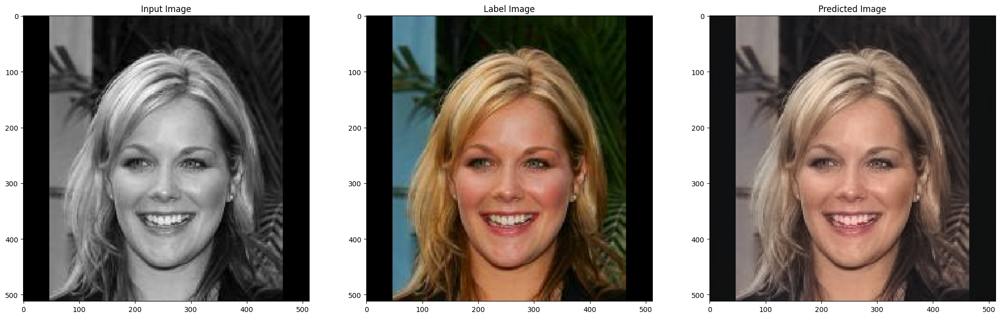

1/1 [==============================] - 0s 20ms/step


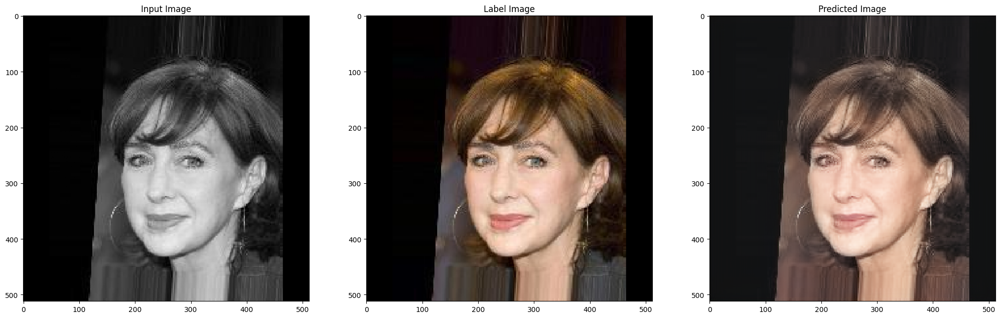

1/1 [==============================] - 0s 34ms/step


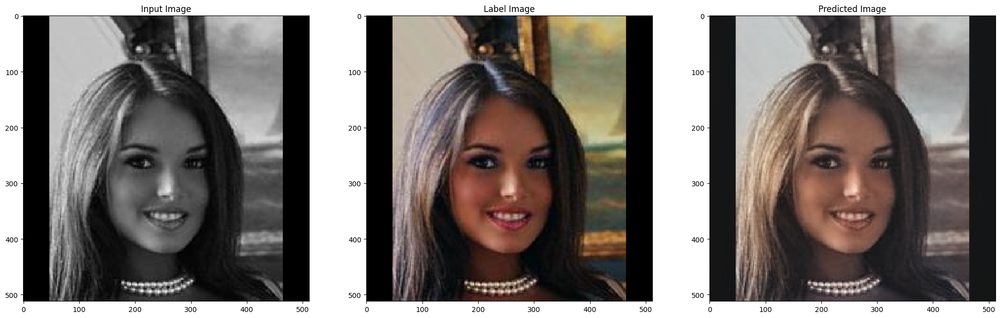

1/1 [==============================] - 0s 16ms/step


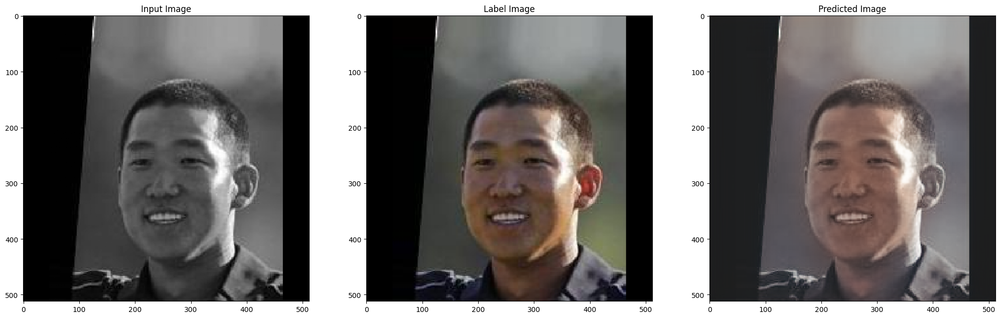


📌 Epoch 1/10 (10.0% Complete)
----------------------------------------
1/1 [==============================] - 0s 25ms/step


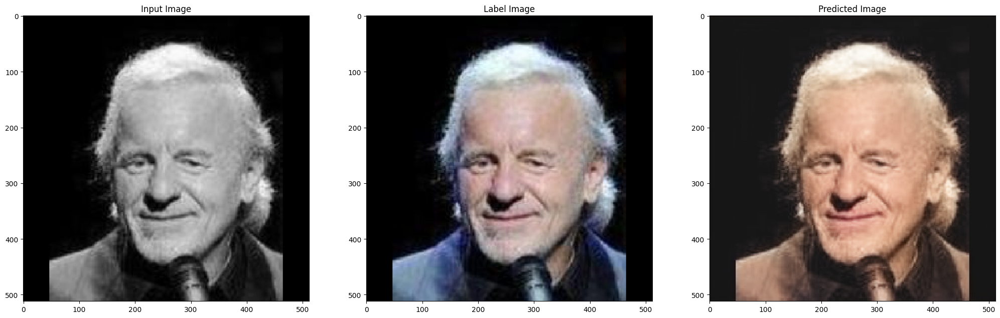

1/1 [==============================] - 0s 20ms/step


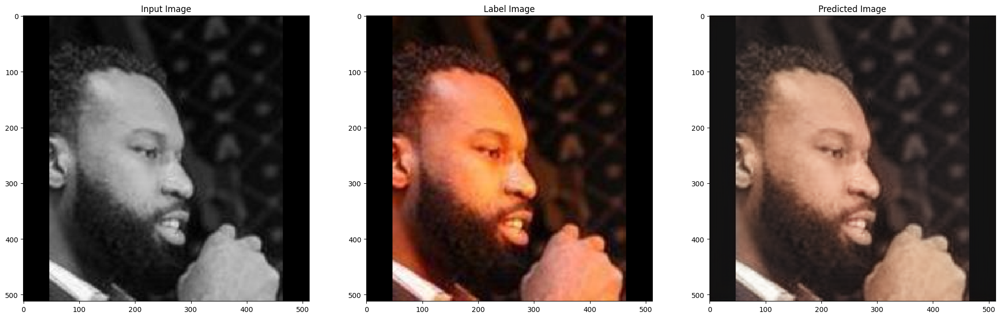

1/1 [==============================] - 0s 20ms/step


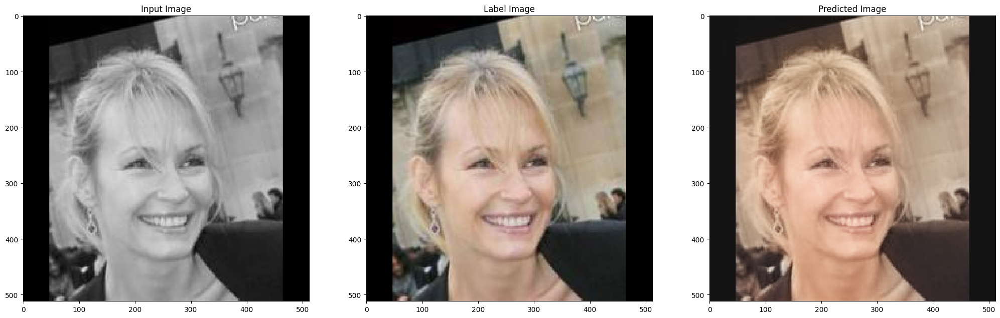

1/1 [==============================] - 0s 42ms/step


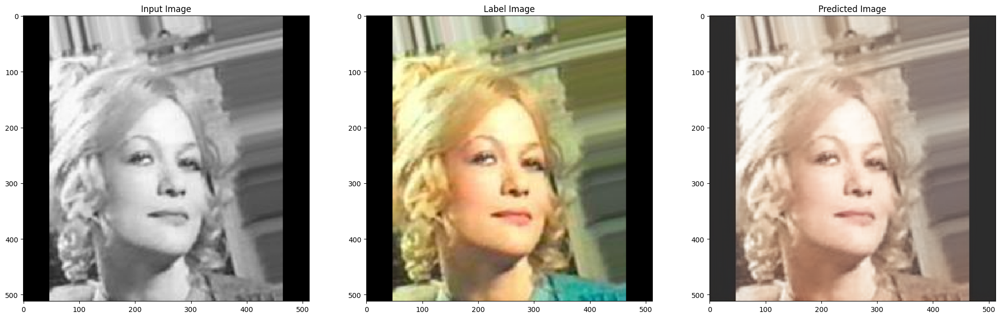

1/1 [==============================] - 0s 19ms/step


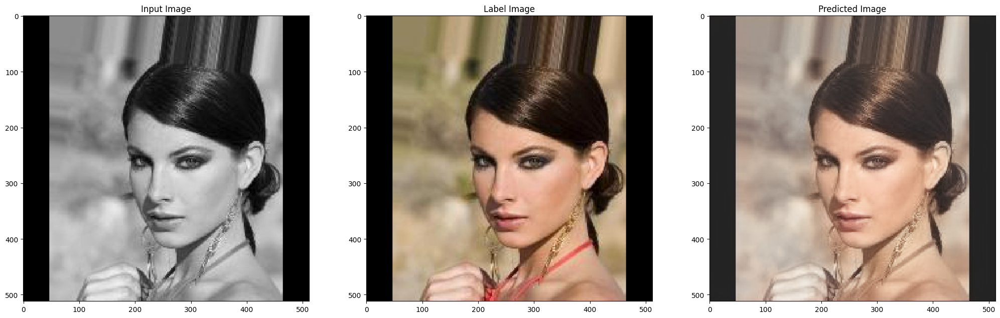

✅ Epoch 1 Complete! New Model Saved as 'new_model6.h5'


📌 Epoch 2/10 (20.0% Complete)
----------------------------------------
 826/4445 [====>.........................] - ETA: 15:54 - loss: 0.0034

KeyboardInterrupt: 

In [56]:
import pickle
import tensorflow as tf

best_loss = 0.0088
total_epochs = 10  # Define total epochs for training

# Load previous model weights
model.load_weights("new_model6.h5")

# Visualize model predictions before training
visualize_model(model, valid_fnames, num_files=5)

for epoch in range(total_epochs):
    print(f"\n📌 Epoch {epoch + 1}/{total_epochs} ({(epoch + 1) / total_epochs * 100:.1f}% Complete)")
    print('-' * 40)

    history = model.fit(
        train_generator,
        steps_per_epoch=num_train_files // BATCH_SIZE,
        epochs=1,  # Train for one epoch at a time
        validation_data=valid_generator,
        validation_steps=num_valid_files // BATCH_SIZE,
        workers=0,  # Prevent multiprocessing issues on Windows
        use_multiprocessing=False
    )

    # Save training history
    try:
        with open("history.pkl", "rb") as f:
            history_dict = pickle.load(f)
    except Exception:
        history_dict = {}

    append_to_history(history)

    with open("history.pkl", "wb") as f:
        pickle.dump(history_dict, f)

    # Visualize model predictions after each epoch
    visualize_model(model, valid_fnames, num_files=5)

    # Save model at every epoch with name including (epoch+4)
    model_filename = f"new_model{epoch+6}.h5"
    model.save(model_filename)

    print(f"✅ Epoch {epoch + 1} Complete! New Model Saved as '{model_filename}'\n")
